In [1]:
import pandas as pd
import numpy as np
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns

C:\Users\chimi\anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\chimi\anaconda3\lib\site-packages\numpy\.libs\libopenblas.EL2C6PLE4ZYW3ECEVIV3OXXGRN2NRFM2.gfortran-win_amd64.dll
C:\Users\chimi\anaconda3\lib\site-packages\numpy\.libs\libopenblas64__v0.3.23-246-g3d31191b-gcc_10_3_0.dll
  warnings.warn("loaded more than 1 DLL from .libs:"
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


In [2]:
file_path = r'C:\Users\chimi\Desktop\Python Data Science Projects\space_debris_classifications\space_debris_classifications\tasks\task 2 - Data Cleaning\space_clean.csv'
space_df = pd.read_csv(file_path)


In [3]:
space_df.head(5)

,OBJECT_NAME,OBJECT_ID,MEAN_ELEMENT_THEORY,MEAN_MOTION,ECCENTRICITY,INCLINATION,RA_OF_ASC_NODE,ARG_OF_PERICENTER,MEAN_ANOMALY,NORAD_CAT_ID,...,Timestamp,Year,Month,Day,Hour,Minute,satellite_age,AP_DIFF,SEMIMINOR_AXIS,ORBITAL_VELOCITY
0,ARIANE 42P+ DEB,1992-072J,SGP4,2.921700,0.652893,7.7156,90.2410,243.1216,38.7796,26741,...,2021-10-31,2021,10,31,22,46,54,26988.776,15655.454942,4.391503
1,SL-8 DEB,1979-028C,SGP4,13.754973,0.003072,82.9193,299.1120,158.9093,201.3337,26743,...,2021-10-31,2021,10,31,16,32,54,45.208,7358.003280,7.360170
2,GSAT 1,2001-015A,SGP4,1.038224,0.023739,12.1717,16.5368,250.1248,146.2900,26745,...,2021-11-01,2021,11,1,5,22,54,1955.958,41186.242434,3.110510
3,CZ-4 DEB,1999-057MB,SGP4,14.775907,0.006062,98.4781,8.7205,37.3771,323.1632,26754,...,2021-10-31,2021,10,31,11,11,54,85.048,7014.947113,7.537940
4,CZ-4 DEB,1999-057MC,SGP4,14.724482,0.006226,98.4232,122.0724,345.1605,27.6061,26755,...,2021-10-31,2021,10,31,17,46,54,87.548,7031.263741,7.529185


In [4]:
space_df.describe()

,MEAN_MOTION,ECCENTRICITY,INCLINATION,RA_OF_ASC_NODE,ARG_OF_PERICENTER,MEAN_ANOMALY,NORAD_CAT_ID,REV_AT_EPOCH,BSTAR,MEAN_MOTION_DOT,...,GP_ID,Year,Month,Day,Hour,Minute,satellite_age,AP_DIFF,SEMIMINOR_AXIS,ORBITAL_VELOCITY
count,14333.000000,14333.000000,14333.000000,14333.000000,14333.000000,14333.000000,14333.000000,14333.000000,14333.000000,14333.000000,...,1.433300e+04,14333.0,14333.000000,14333.000000,14333.000000,14333.000000,14333.0,14333.000000,14333.000000,14333.000000
mean,12.462145,0.067184,74.338011,182.287981,165.940390,191.016569,39398.865067,32958.161446,-0.000578,0.000049,...,1.885641e+08,2021.0,10.202051,24.463615,12.178888,28.777786,54.0,2928.728578,10126.877430,6.902443
std,4.513207,0.181632,29.642649,116.732643,104.491624,109.913689,6491.393333,28470.796341,0.032282,0.002394,...,1.392029e+05,0.0,0.401544,11.943561,7.114673,17.696055,0.0,9901.028720,8721.035399,1.340836
min,0.051783,0.000005,0.001400,0.020000,0.008200,0.004800,26741.000000,0.000000,-0.796460,-0.014873,...,1.860926e+08,2021.0,10.000000,1.000000,0.000000,0.000000,54.0,0.128000,6542.823338,1.144977
25%,13.452156,0.000719,53.055300,71.969700,77.351400,89.918100,33952.000000,5814.000000,0.000058,0.000001,...,1.885667e+08,2021.0,10.000000,28.000000,6.000000,13.000000,54.0,13.371000,6956.029437,7.305758
50%,14.278105,0.003402,86.368900,189.343600,150.365700,207.119500,40129.000000,28880.000000,0.000271,0.000010,...,1.885986e+08,2021.0,10.000000,31.000000,13.000000,29.000000,54.0,52.234000,7176.710127,7.452320
75%,14.964325,0.013479,98.561700,292.469900,258.350900,284.191100,45136.000000,61553.000000,0.000833,0.000032,...,1.886107e+08,2021.0,10.000000,31.000000,19.000000,44.000000,54.0,202.359000,7463.712294,7.569845
max,16.404097,0.897218,144.586200,359.967900,359.989900,359.981900,49379.000000,99945.000000,0.595600,0.225321,...,1.886250e+08,2021.0,11.000000,31.000000,23.000000,59.000000,54.0,292236.511000,295125.380659,7.805225


In [5]:
# Exploring 
space_df.shape

(14333, 35)

In [6]:
space_df.columns

Index(['OBJECT_NAME', 'OBJECT_ID', 'MEAN_ELEMENT_THEORY', 'MEAN_MOTION',
       'ECCENTRICITY', 'INCLINATION', 'RA_OF_ASC_NODE', 'ARG_OF_PERICENTER',
       'MEAN_ANOMALY', 'NORAD_CAT_ID', 'REV_AT_EPOCH', 'BSTAR',
       'MEAN_MOTION_DOT', 'MEAN_MOTION_DDOT', 'SEMIMAJOR_AXIS', 'PERIOD',
       'APOAPSIS', 'PERIAPSIS', 'OBJECT_TYPE', 'RCS_SIZE', 'COUNTRY_CODE',
       'LAUNCH_DATE', 'SITE', 'FILE', 'GP_ID', 'Timestamp', 'Year', 'Month',
       'Day', 'Hour', 'Minute', 'satellite_age', 'AP_DIFF', 'SEMIMINOR_AXIS',
       'ORBITAL_VELOCITY'],
      dtype='object')

In [7]:
space_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14333 entries, 0 to 14332
Data columns (total 35 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   OBJECT_NAME          14333 non-null  object 
 1   OBJECT_ID            14333 non-null  object 
 2   MEAN_ELEMENT_THEORY  14333 non-null  object 
 3   MEAN_MOTION          14333 non-null  float64
 4   ECCENTRICITY         14333 non-null  float64
 5   INCLINATION          14333 non-null  float64
 6   RA_OF_ASC_NODE       14333 non-null  float64
 7   ARG_OF_PERICENTER    14333 non-null  float64
 8   MEAN_ANOMALY         14333 non-null  float64
 9   NORAD_CAT_ID         14333 non-null  int64  
 10  REV_AT_EPOCH         14333 non-null  int64  
 11  BSTAR                14333 non-null  float64
 12  MEAN_MOTION_DOT      14333 non-null  float64
 13  MEAN_MOTION_DDOT     14333 non-null  float64
 14  SEMIMAJOR_AXIS       14333 non-null  float64
 15  PERIOD               14333 non-null 

In [8]:
space_df.duplicated().sum()

0

In [9]:
space_df.isnull().sum()

OBJECT_NAME              0
OBJECT_ID                0
MEAN_ELEMENT_THEORY      0
MEAN_MOTION              0
ECCENTRICITY             0
INCLINATION              0
RA_OF_ASC_NODE           0
ARG_OF_PERICENTER        0
MEAN_ANOMALY             0
NORAD_CAT_ID             0
REV_AT_EPOCH             0
BSTAR                    0
MEAN_MOTION_DOT          0
MEAN_MOTION_DDOT         0
SEMIMAJOR_AXIS           0
PERIOD                   0
APOAPSIS                 0
PERIAPSIS                0
OBJECT_TYPE              0
RCS_SIZE               159
COUNTRY_CODE             0
LAUNCH_DATE              0
SITE                     0
FILE                     0
GP_ID                    0
Timestamp                0
Year                     0
Month                    0
Day                      0
Hour                     0
Minute                   0
satellite_age            0
AP_DIFF                  0
SEMIMINOR_AXIS           0
ORBITAL_VELOCITY         0
dtype: int64

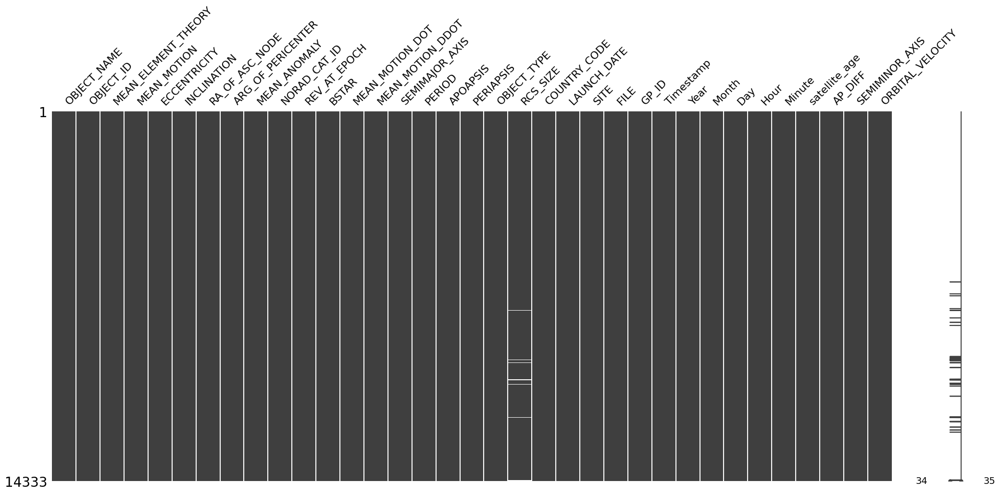

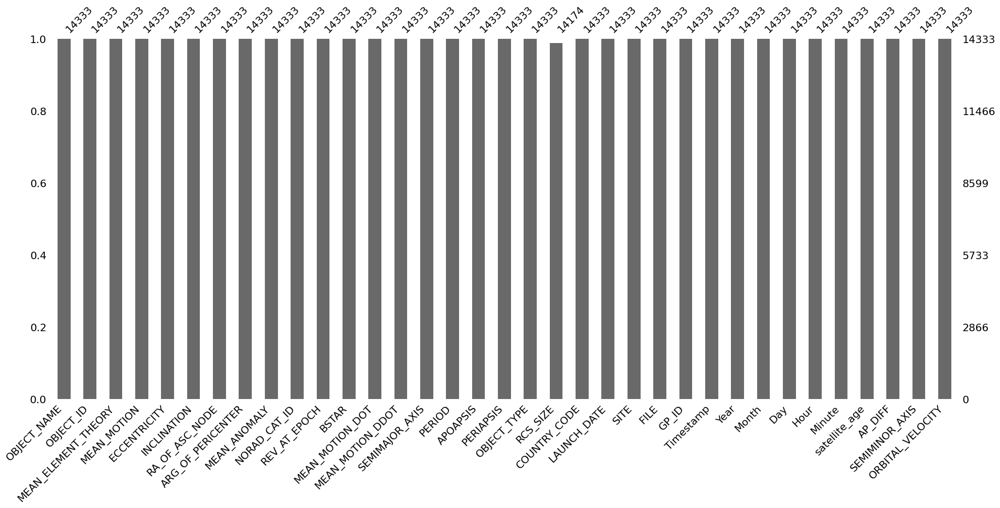

In [10]:
# Visualize missing values using a matrix plot
msno.matrix(space_df)
plt.show()

# Visualizing missing values using a bar chart
msno.bar(space_df)
plt.show()

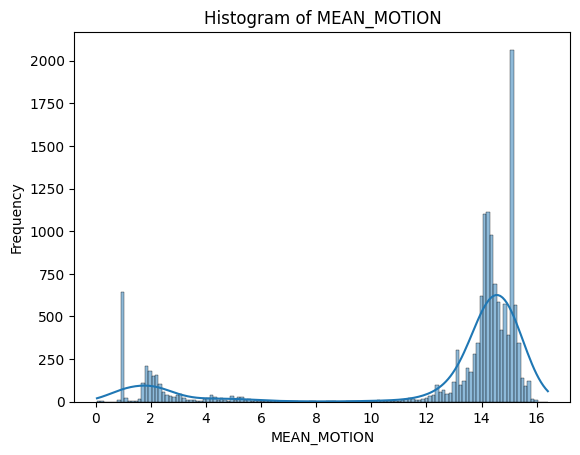

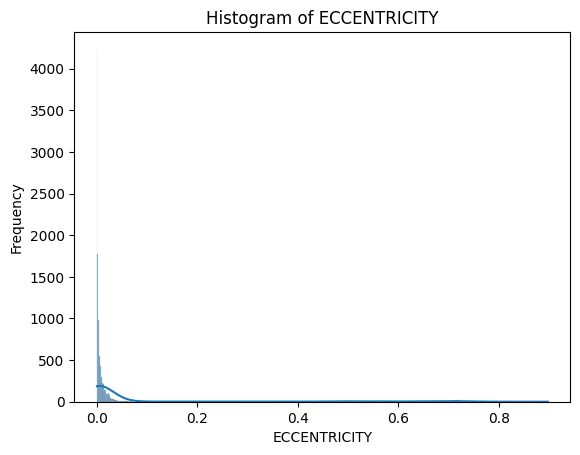

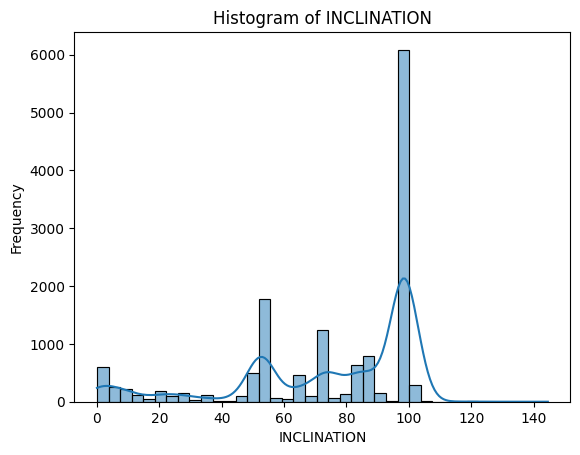

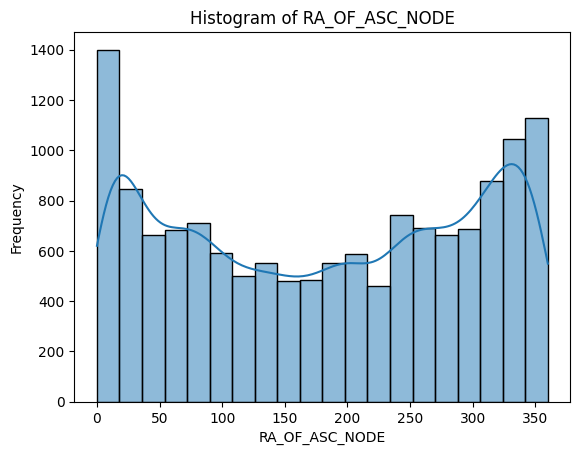

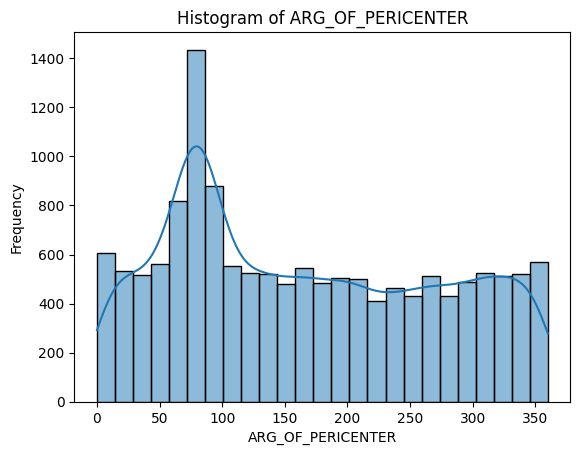

...

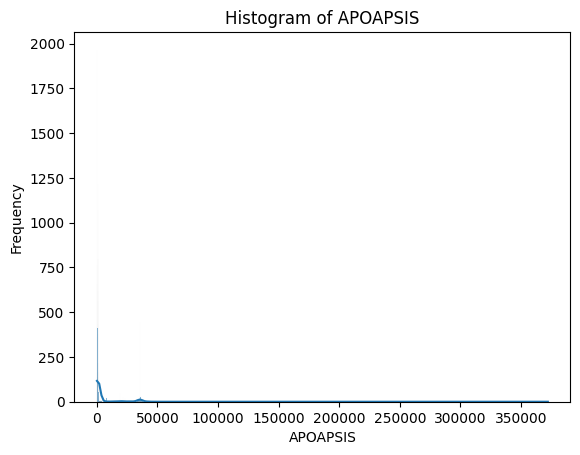

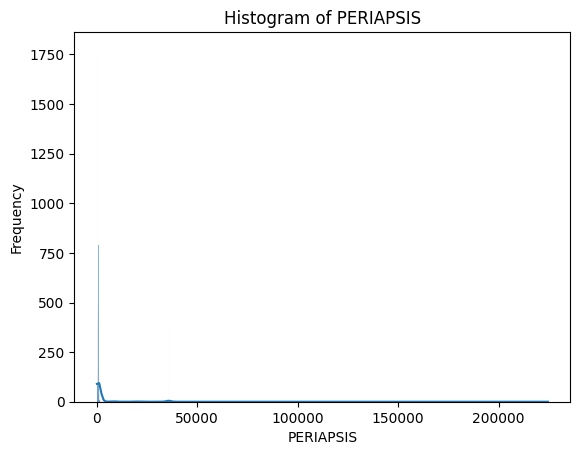

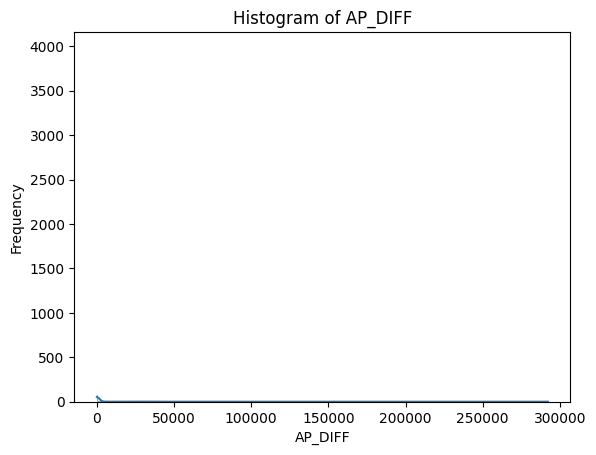

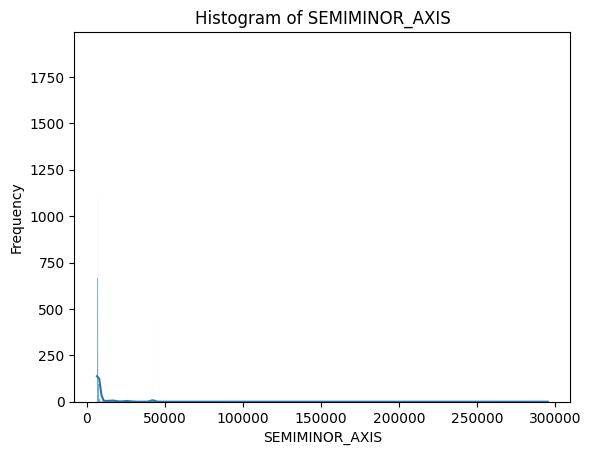

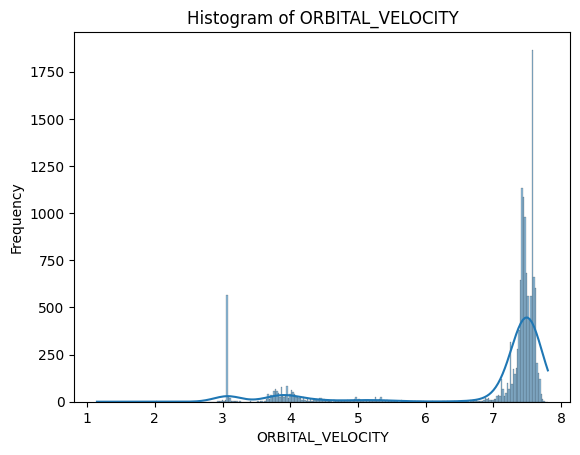

In [11]:
# What is the distribution of the numerical variables?
# Most of the numerical data distribution are not normally distributed.

numerical_cols = ['MEAN_MOTION', 'ECCENTRICITY', 'INCLINATION', 'RA_OF_ASC_NODE', 
                  'ARG_OF_PERICENTER', 'MEAN_ANOMALY', 'REV_AT_EPOCH', 'BSTAR', 
                  'MEAN_MOTION_DOT', 'MEAN_MOTION_DDOT', 'SEMIMAJOR_AXIS', 'PERIOD', 
                  'APOAPSIS', 'PERIAPSIS', 'AP_DIFF', 'SEMIMINOR_AXIS', 'ORBITAL_VELOCITY']

for i, col in enumerate(numerical_cols):
    plt.figure(i)
    sns.histplot(space_df[col], kde=True)
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.title(f'Histogram of {col}')
    plt.show()

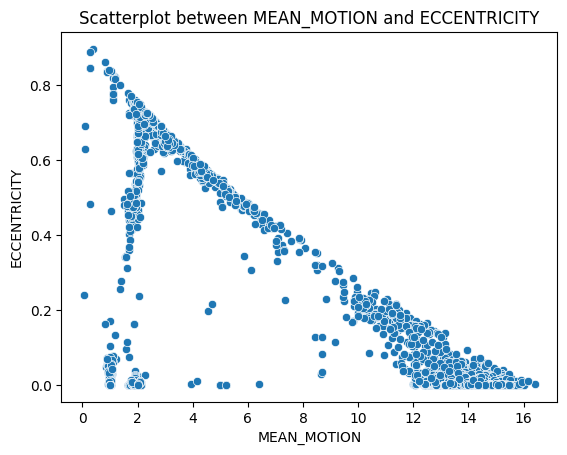

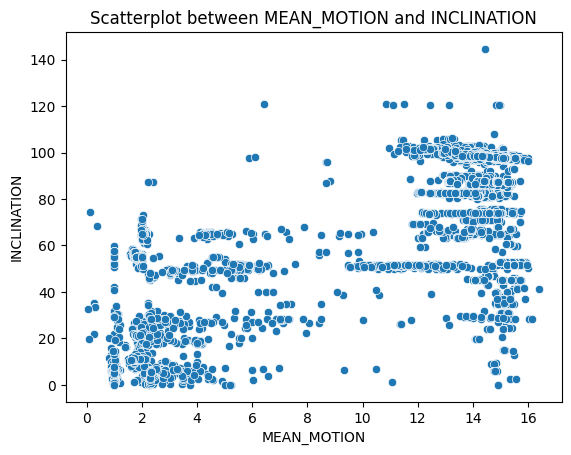

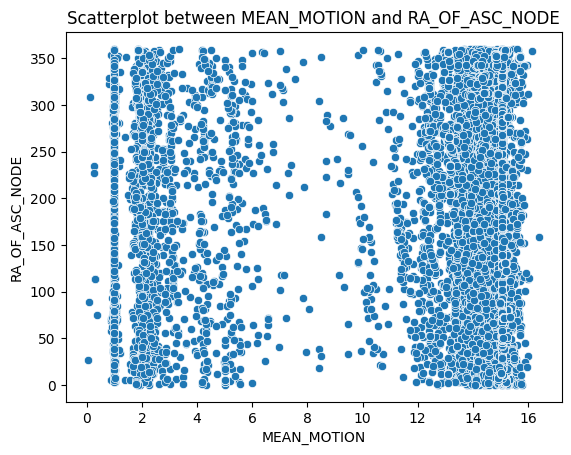

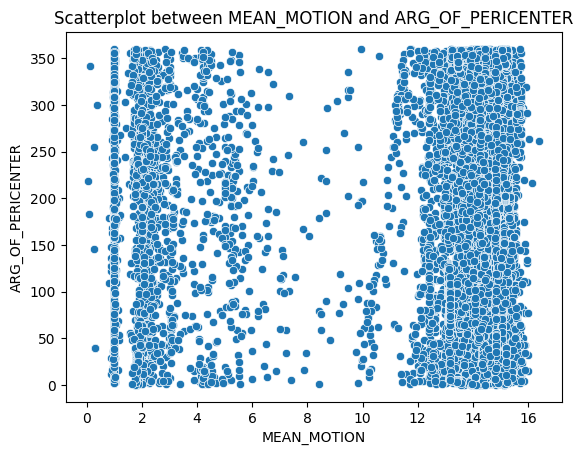

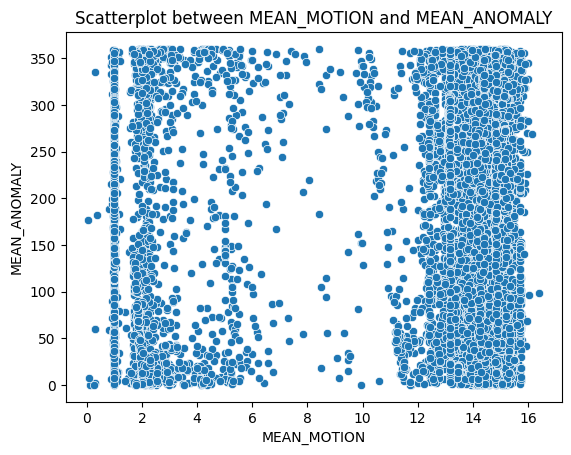

...

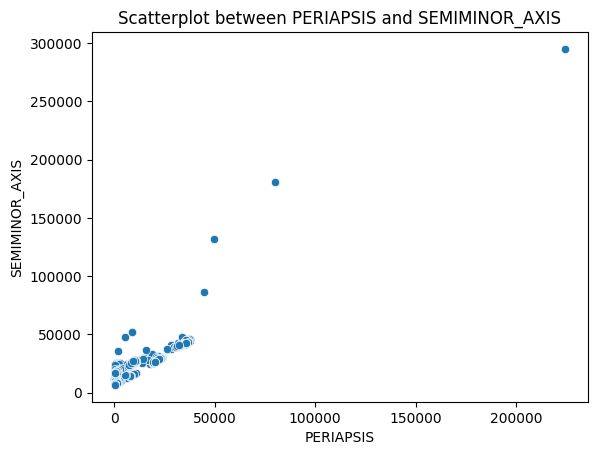

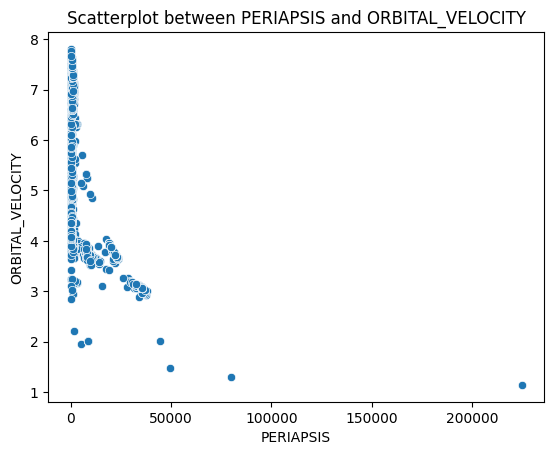

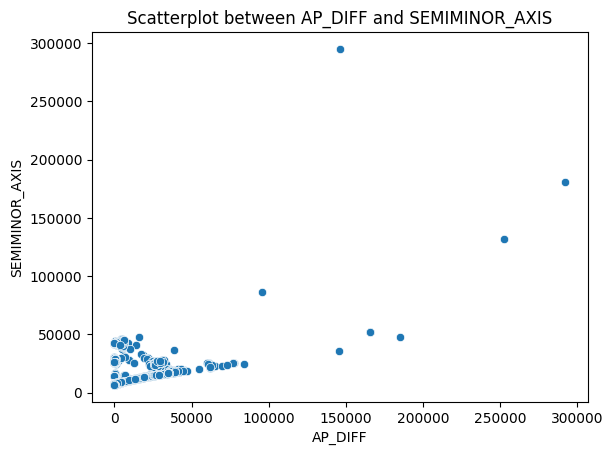

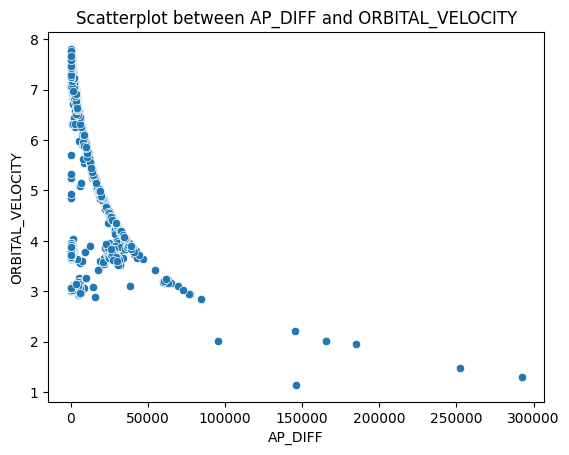

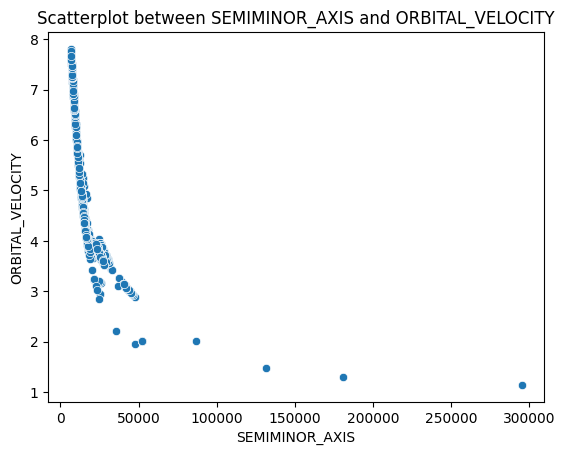

In [12]:
# Relationship between numerical variables


# Create individual scatterplots for each combination of numerical variables
for i, col1 in enumerate(numerical_cols):
    for j, col2 in enumerate(numerical_cols):
        if i < j:  # Exclude combinations of a variable with itself and duplicate pairs
            plt.figure()
            sns.scatterplot(data=space_df, x=col1, y=col2)
            plt.xlabel(col1)
            plt.ylabel(col2)
            plt.title(f'Scatterplot between {col1} and {col2}')
            plt.show()



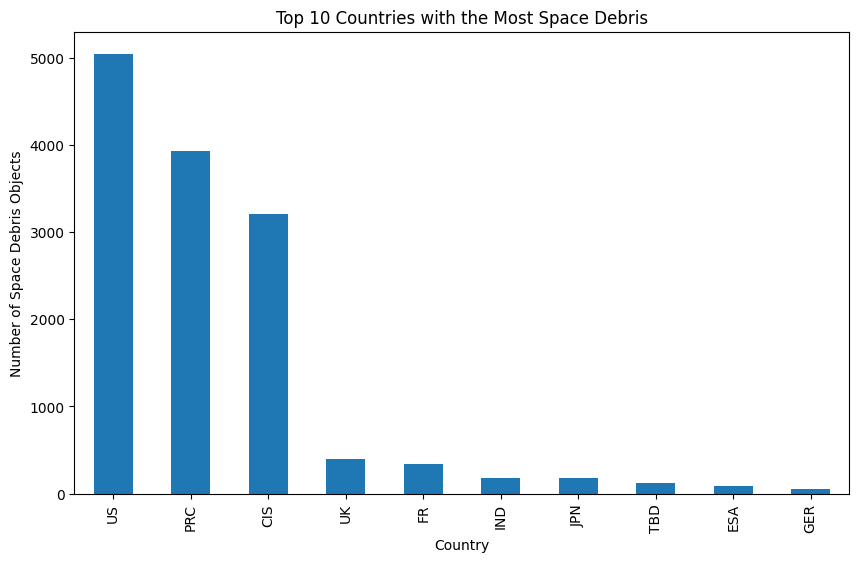

In [13]:
# Which Country does the most space debris belong too?
country_counts = space_df['COUNTRY_CODE'].value_counts().head(10)

# Plotting the bar chart
plt.figure(figsize=(10, 6))
country_counts.plot(kind='bar')
plt.xlabel('Country')
plt.ylabel('Number of Space Debris Objects')
plt.title('Top 10 Countries with the Most Space Debris')
plt.show()


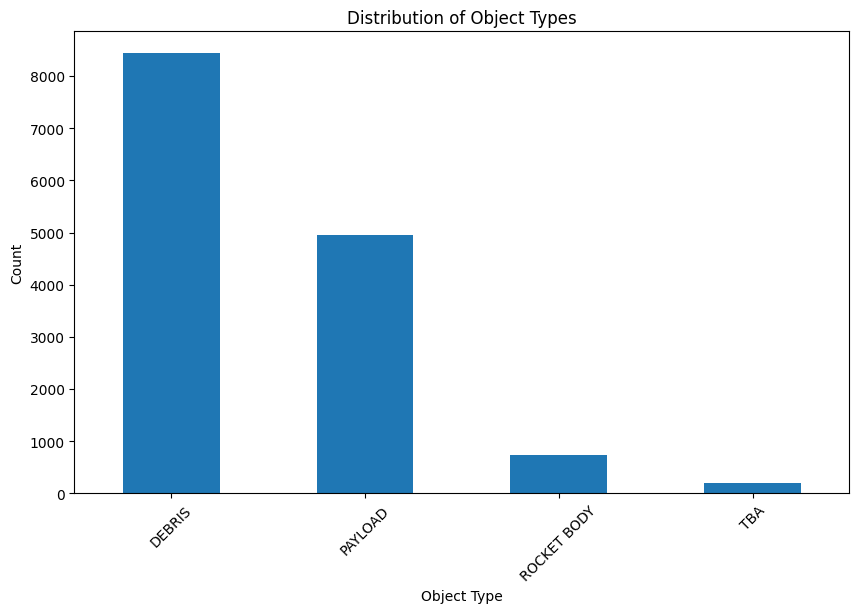

In [14]:
# What are the different types of objects present in the space debris dataset?

# Count the occurrences of each object type
object_type_counts = space_df['OBJECT_TYPE'].value_counts()

# Plotting the bar chart
plt.figure(figsize=(10, 6))
object_type_counts.plot(kind='bar')
plt.xlabel('Object Type')
plt.ylabel('Count')
plt.title('Distribution of Object Types')
plt.xticks(rotation=45)
plt.show()

# Drop the objects that have not been disclosed
space_df = space_df[space_df['OBJECT_TYPE'] !=  'TBA']

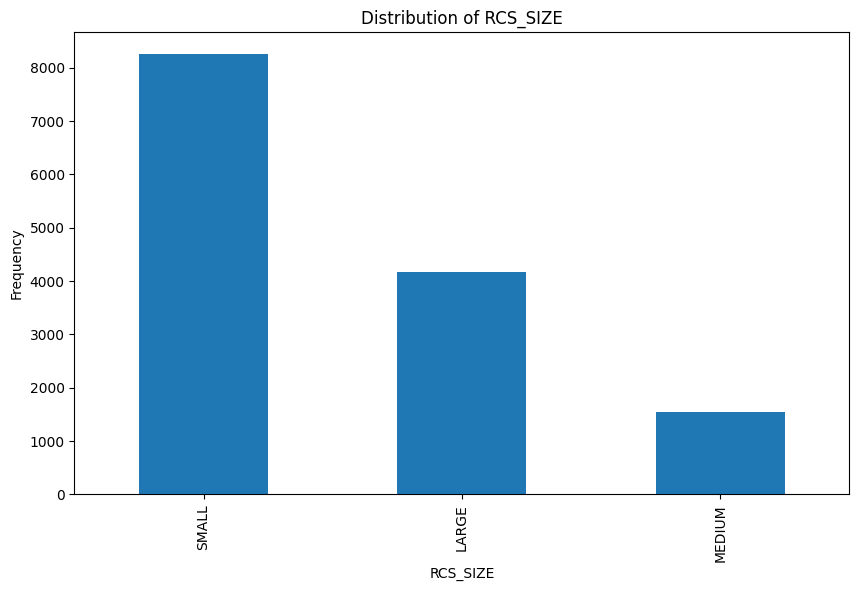

In [15]:
# What is the distribution of RCS_SIZE among the objects?


rcs_size_counts = space_df['RCS_SIZE'].value_counts()

plt.figure(figsize=(10, 6))
rcs_size_counts.plot(kind='bar')
plt.xlabel('RCS_SIZE')
plt.ylabel('Frequency')
plt.title('Distribution of RCS_SIZE')
plt.show()

<Figure size 1000x600 with 0 Axes>

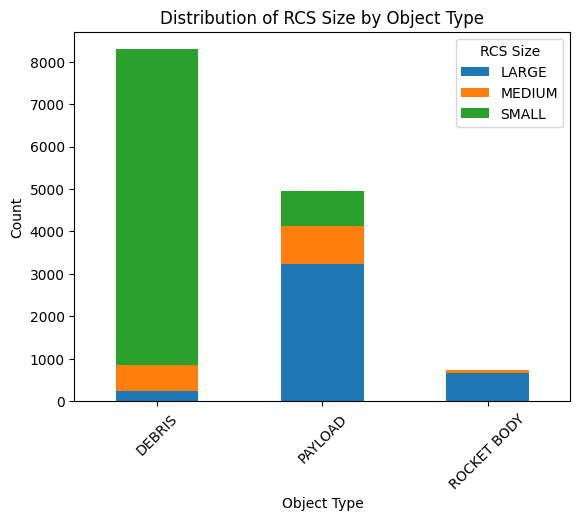

In [16]:
# Is there a relationship between the object type and the RCS size among space debris? 
# Do certain object types tend to have larger RCS sizes compared to others?

# Create a crosstab of object type and RCS size
cross_table = pd.crosstab(space_df['OBJECT_TYPE'], space_df['RCS_SIZE'])

# Plotting the stacked bar chart
plt.figure(figsize=(10, 6))
cross_table.plot(kind='bar', stacked=True)
plt.xlabel('Object Type')
plt.ylabel('Count')
plt.title('Distribution of RCS Size by Object Type')
plt.xticks(rotation=45)
plt.legend(title='RCS Size')
plt.show()

C:\Users\chimi\AppData\Local\Temp\ipykernel_4436\749432876.py:10: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=space_df, x='OBJECT_TYPE', y=col, ci=None)
C:\Users\chimi\AppData\Local\Temp\ipykernel_4436\749432876.py:10: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=space_df, x='OBJECT_TYPE', y=col, ci=None)
C:\Users\chimi\AppData\Local\Temp\ipykernel_4436\749432876.py:10: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=space_df, x='OBJECT_TYPE', y=col, ci=None)
C:\Users\chimi\AppData\Local\Temp\ipykernel_4436\749432876.py:10: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=space_df, x='OBJECT_TYPE', y=col, ci=None)
C:\Users\chimi\AppData\Local\Temp\ipykernel_4436\749432876.py:10: FutureWarning: 

The `ci` parameter is deprecated.

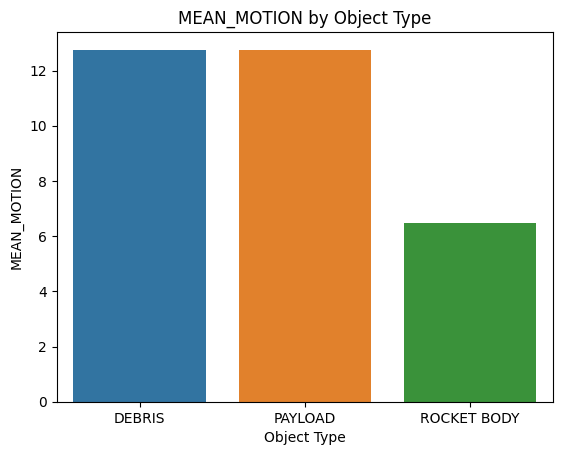

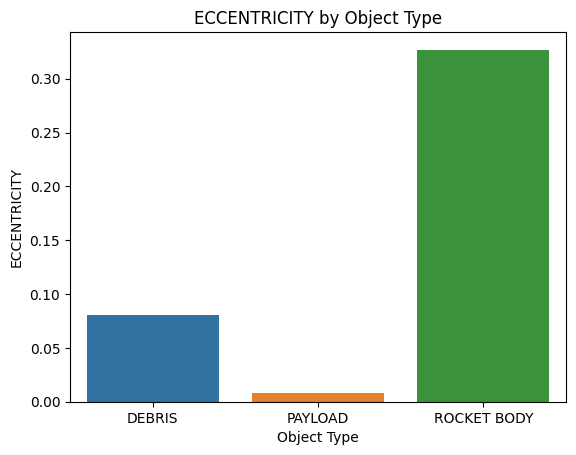

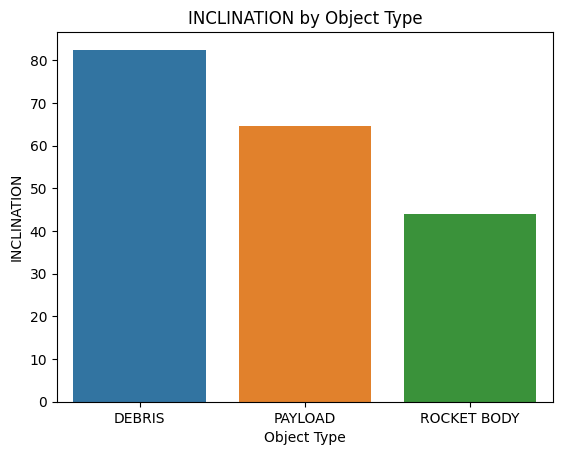

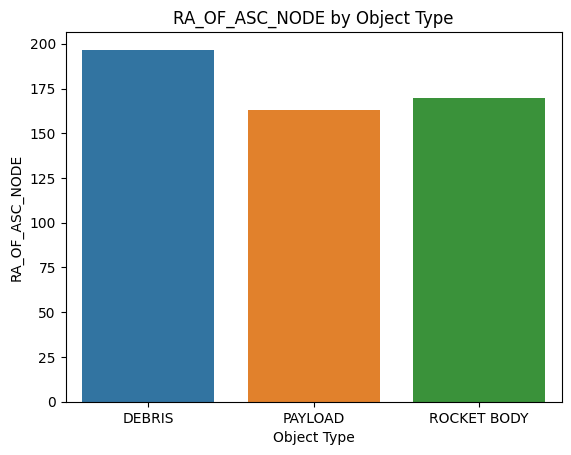

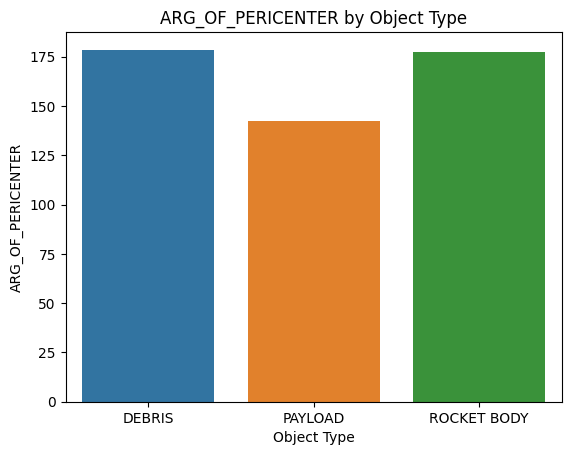

...

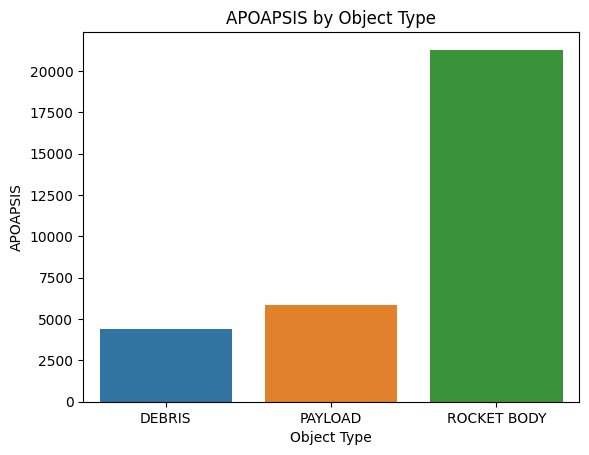

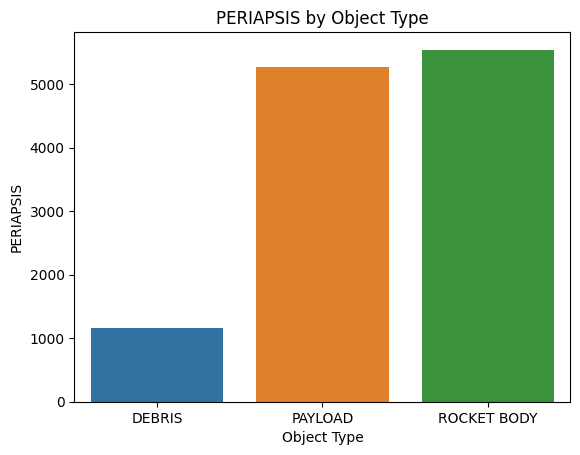

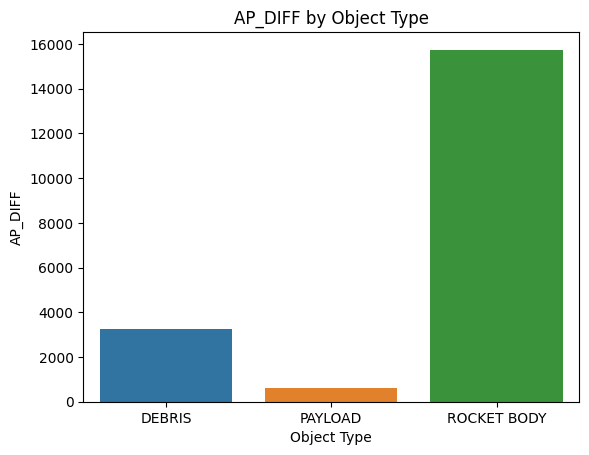

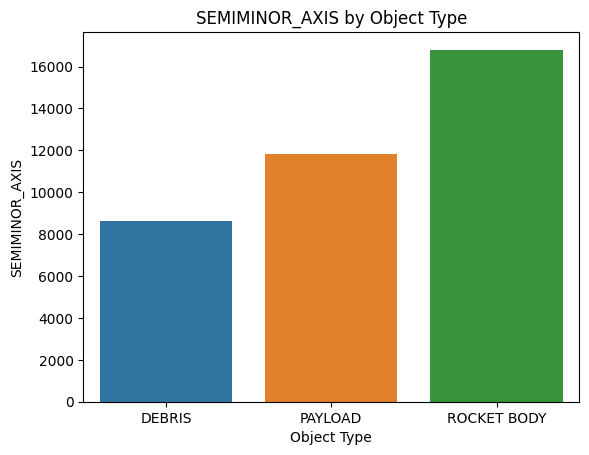

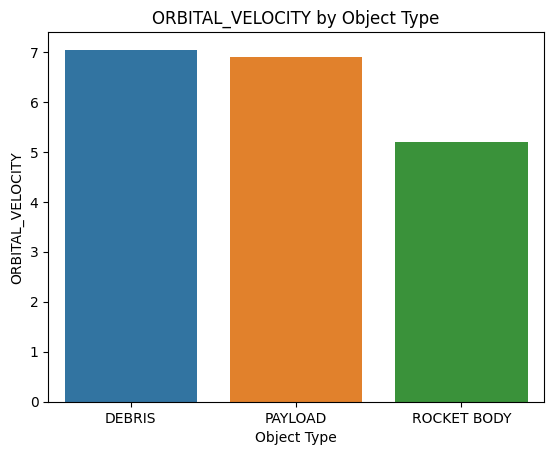

In [17]:
# How does mean_motion, eccentricity etc.. vary across different object types?


# Select the numerical variables of interest


# Iterate over each numerical variable
for col in numerical_cols:
    plt.figure()
    sns.barplot(data=space_df, x='OBJECT_TYPE', y=col, ci=None)
    plt.xlabel('Object Type')
    plt.ylabel(col)
    plt.title(f'{col} by Object Type')

plt.show()

C:\Users\chimi\AppData\Local\Temp\ipykernel_4436\1126587453.py:7: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=space_df, x='RCS_SIZE', y=col, ci=None)
C:\Users\chimi\AppData\Local\Temp\ipykernel_4436\1126587453.py:7: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=space_df, x='RCS_SIZE', y=col, ci=None)
C:\Users\chimi\AppData\Local\Temp\ipykernel_4436\1126587453.py:7: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=space_df, x='RCS_SIZE', y=col, ci=None)
C:\Users\chimi\AppData\Local\Temp\ipykernel_4436\1126587453.py:7: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=space_df, x='RCS_SIZE', y=col, ci=None)
C:\Users\chimi\AppData\Local\Temp\ipykernel_4436\1126587453.py:7: FutureWarning: 

The `ci` parameter is deprecated. Use `errorb

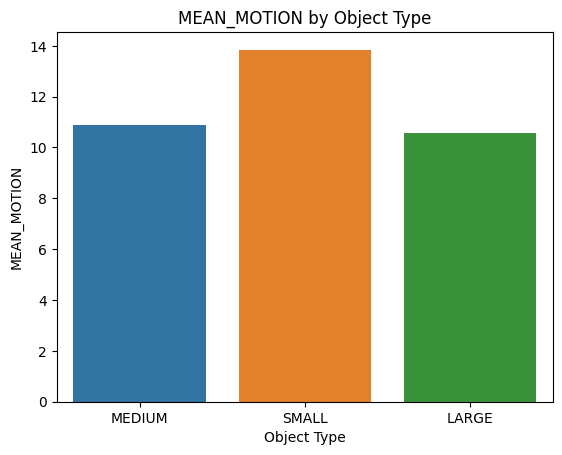

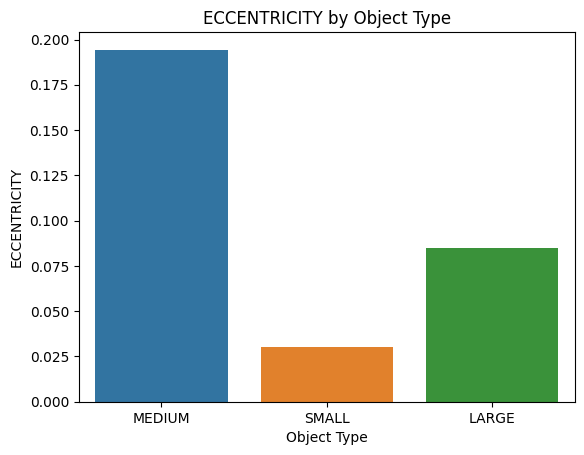

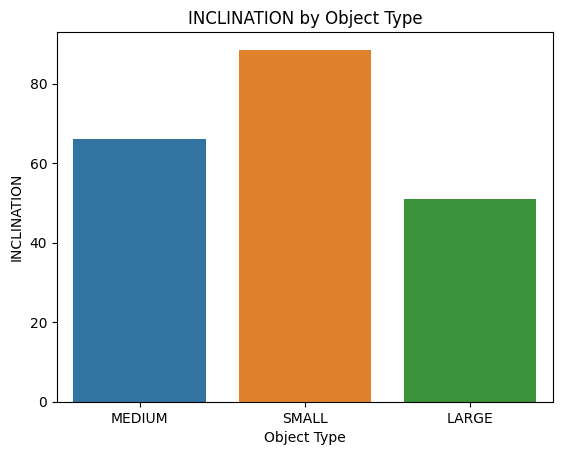

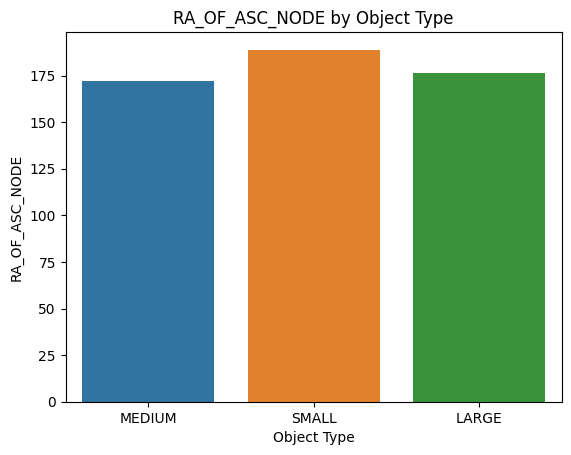

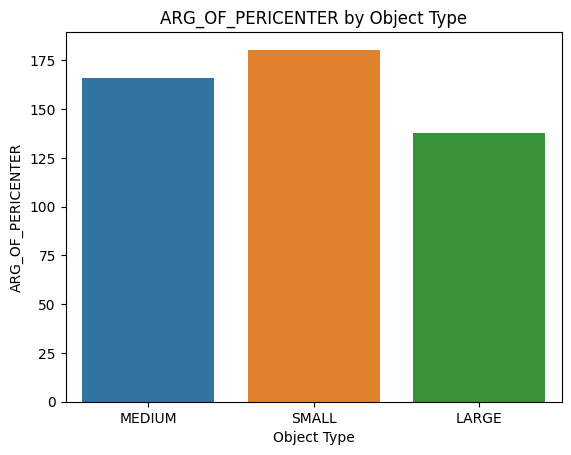

...

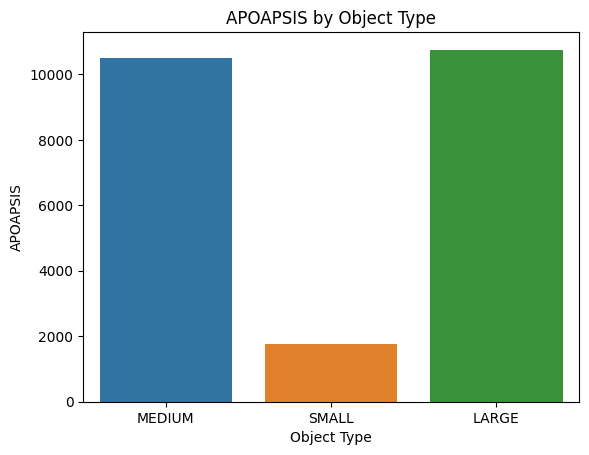

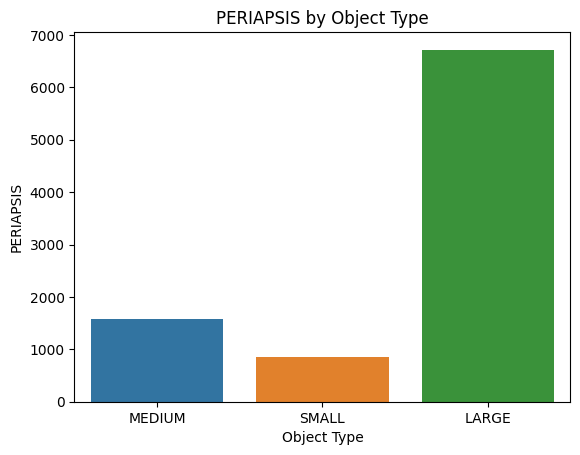

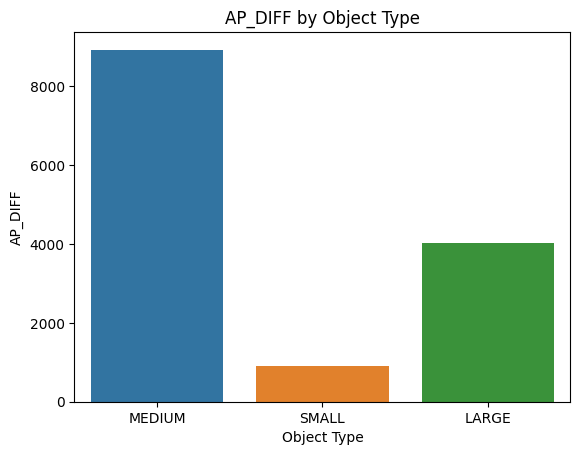

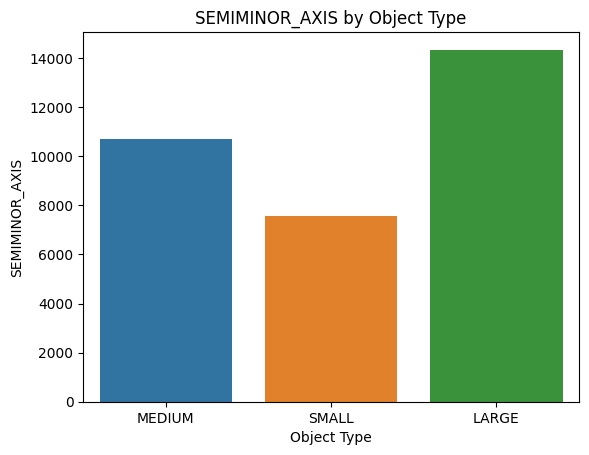

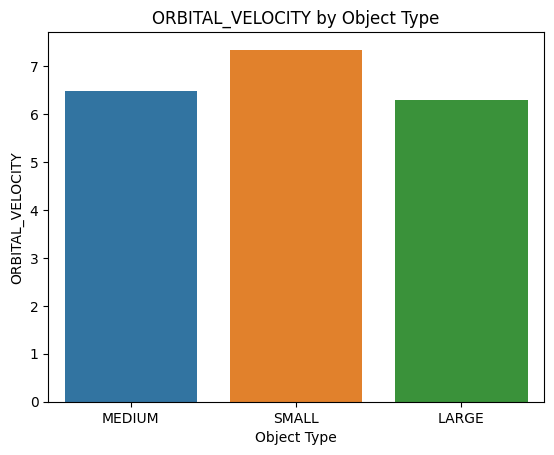

In [28]:
# How does mean_motion, eccentricity etc.. vary across different RCS Size?


# Iterate over each numerical variable
for col in numerical_cols:
    plt.figure()
    sns.barplot(data=space_df, x='RCS_SIZE', y=col, ci=None)
    plt.xlabel('Object Type')
    plt.ylabel(col)
    plt.title(f'{col} by Object Type')

plt.show()


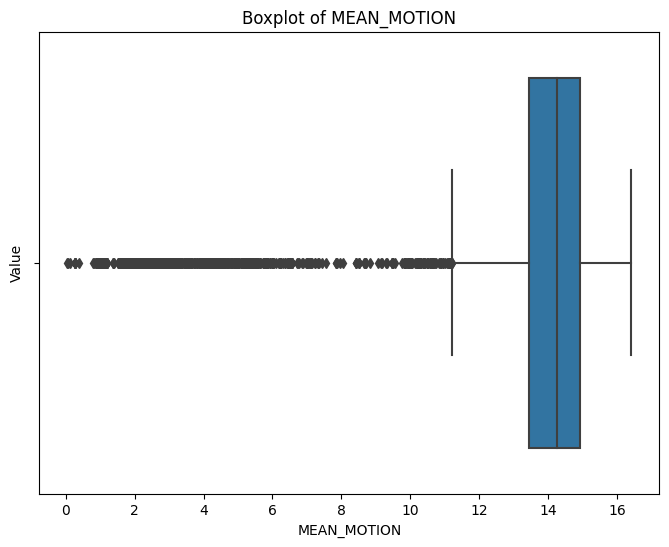

In [29]:
# How is the distribution of the mean motion variable?

# Create a boxplot
plt.figure(figsize=(8, 6))
sns.boxplot(data=space_df, x='MEAN_MOTION')
plt.xlabel('MEAN_MOTION')
plt.ylabel('Value')
plt.title('Boxplot of MEAN_MOTION')

# Display the plot
plt.show()

Text(0.5, 1.0, 'Boxplot of ECCENTRICITY')

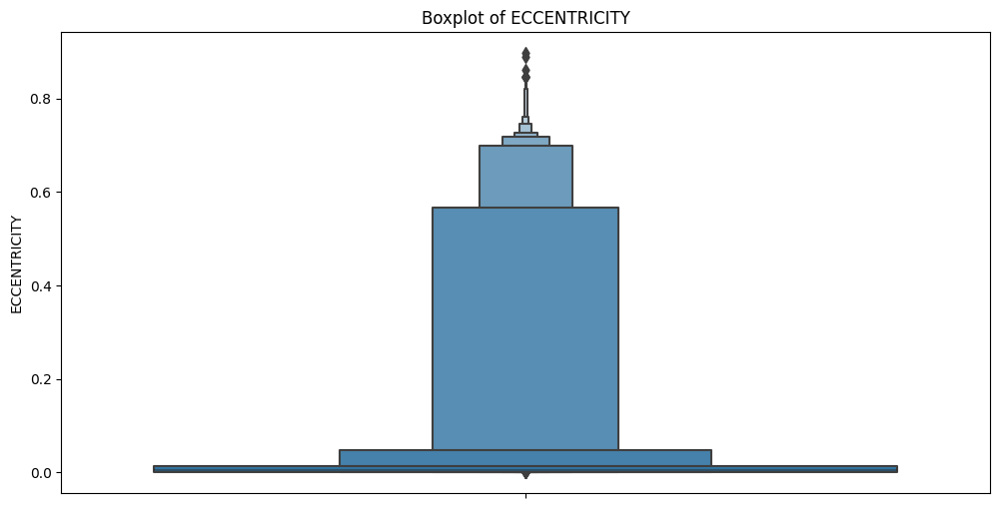

In [30]:
# What is the range and distribution of ECCENTRICITY among the objects? 

plt.figure(figsize=(12,6))
sns.boxenplot(data=space_df, y='ECCENTRICITY')
plt.ylabel('ECCENTRICITY')
plt.title('Boxplot of ECCENTRICITY')


count    14125.000000
mean        74.128021
std         29.727391
min          0.001400
25%         53.055200
50%         86.346000
75%         98.582000
max        144.586200
Name: INCLINATION, dtype: float64
53.0544    49
53.0549    48
53.0545    47
53.0552    46
53.0558    42
53.0555    41
53.0543    41
53.0542    40
53.0556    40
53.0541    40
Name: INCLINATION, dtype: int64


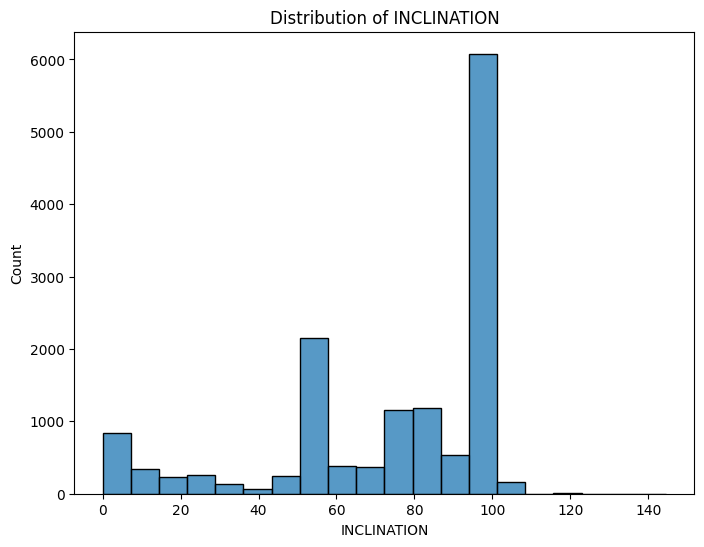

In [31]:
# What are the common values and distribution of 'INCLINATION'?


# Summary statistics
inclination_stats = space_df['INCLINATION'].describe()
print(inclination_stats)

# Common values
inclination_counts = space_df['INCLINATION'].value_counts().head(10)
print(inclination_counts)

# Distribution plot
plt.figure(figsize=(8, 6))
sns.histplot(data=space_df, x='INCLINATION', bins=20)
plt.xlabel('INCLINATION')
plt.ylabel('Count')
plt.title('Distribution of INCLINATION')

# Display the plots
plt.show()

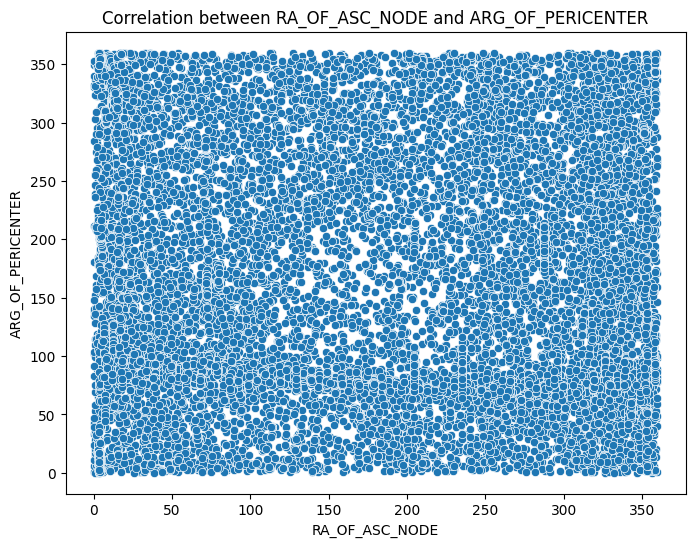

In [32]:
# Is there any correlation between RA_OF_ASC_NODE and ARG_OF_PERICENTER?

# Scatter plot
plt.figure(figsize=(8, 6))
sns.scatterplot(data=space_df, x='RA_OF_ASC_NODE', y='ARG_OF_PERICENTER')
plt.xlabel('RA_OF_ASC_NODE')
plt.ylabel('ARG_OF_PERICENTER')
plt.title('Correlation between RA_OF_ASC_NODE and ARG_OF_PERICENTER')


# Display the plot
plt.show()


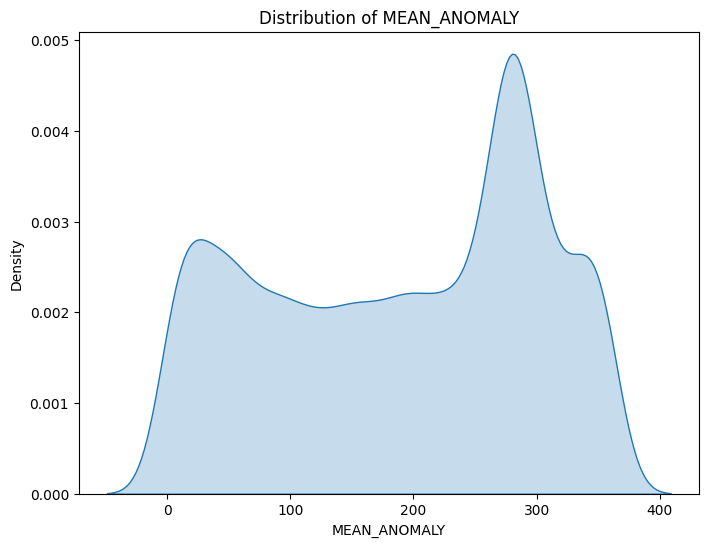

In [33]:
# What is the distribution of MEAN_ANOMALY among the objects?

# Kernel density plot
plt.figure(figsize=(8, 6))
sns.kdeplot(data=space_df, x='MEAN_ANOMALY', fill=True)
plt.xlabel('MEAN_ANOMALY')
plt.ylabel('Density')
plt.title('Distribution of MEAN_ANOMALY')

# Display the plots
plt.show()

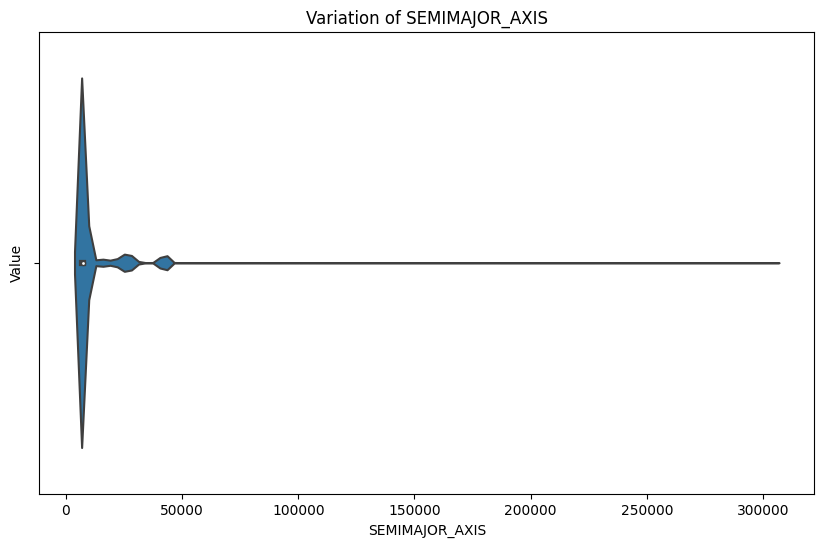

In [34]:
# How does the SEMIMAJOR_AXIS vary across the objects?

plt.figure(figsize=(10, 6))
sns.violinplot(data=space_df, x='SEMIMAJOR_AXIS')
plt.xlabel('SEMIMAJOR_AXIS')
plt.ylabel('Value')
plt.title('Variation of SEMIMAJOR_AXIS')
plt.show()

Range of PERIOD: 27720.646


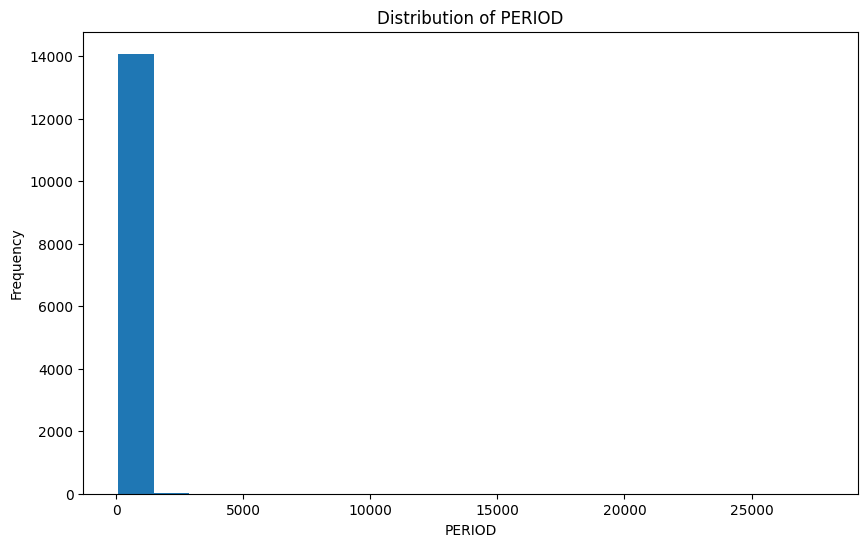

In [35]:
# What is the range and distribution of PERIOD?

# Calculate the range
period_range = np.ptp(space_df['PERIOD'])

# Print the range
print("Range of PERIOD:", period_range)

# Generate a histogram
plt.figure(figsize=(10, 6))
plt.hist(space_df['PERIOD'], bins=20)
plt.xlabel('PERIOD')
plt.ylabel('Frequency')
plt.title('Distribution of PERIOD')
plt.show()

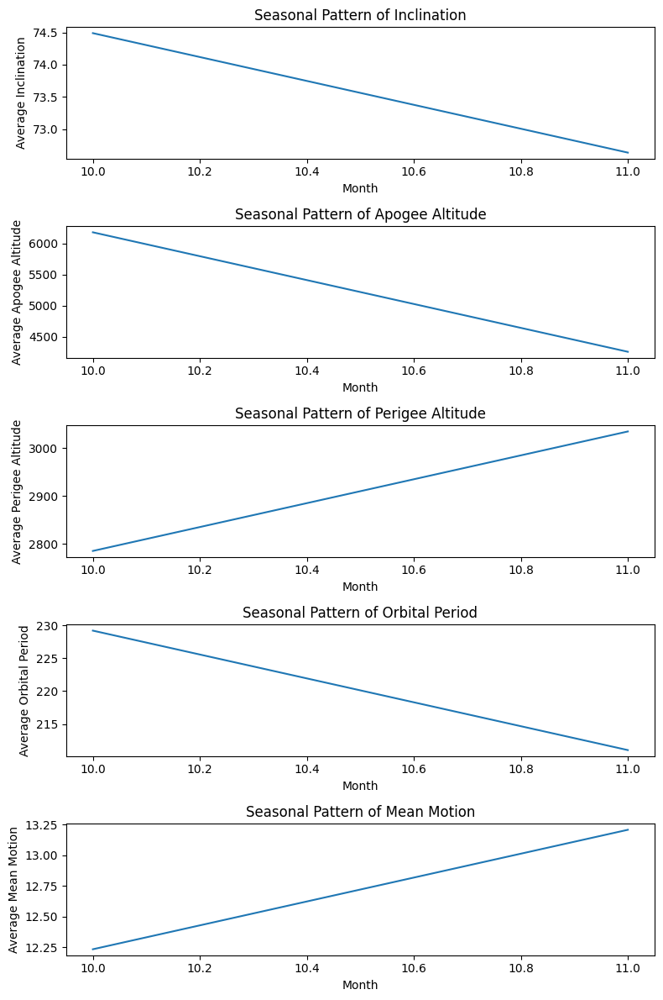

In [36]:
# Are there any noticeable seasonal variations in orbital characteristics of the objects?

# Convert the 'Timestamp' column to a pandas datetime type

# Group the data by month and calculate the average inclination, apogee, perigee, orbital period, and mean motion for each month
mean_inclination_by_month = space_df.groupby(['Month'])['INCLINATION'].mean()
mean_apogee_by_month = space_df.groupby(['Month'])['APOAPSIS'].mean()
mean_perigee_by_month = space_df.groupby(['Month'])['PERIAPSIS'].mean()
mean_period_by_month = space_df.groupby(['Month'])['PERIOD'].mean()
mean_mean_motion_by_month = space_df.groupby(['Month'])['MEAN_MOTION'].mean()

# Create subplots for each plot
fig, axes = plt.subplots(5, 1, figsize=(8, 12))

# Plot the seasonal pattern for inclination
axes[0].plot(mean_inclination_by_month)
axes[0].set_xlabel('Month')
axes[0].set_ylabel('Average Inclination')
axes[0].set_title('Seasonal Pattern of Inclination')

# Plot the seasonal pattern for apogee altitude
axes[1].plot(mean_apogee_by_month)
axes[1].set_xlabel('Month')
axes[1].set_ylabel('Average Apogee Altitude')
axes[1].set_title('Seasonal Pattern of Apogee Altitude')

# Plot the seasonal pattern for perigee altitude
axes[2].plot(mean_perigee_by_month)
axes[2].set_xlabel('Month')
axes[2].set_ylabel('Average Perigee Altitude')
axes[2].set_title('Seasonal Pattern of Perigee Altitude')

# Plot the seasonal pattern for orbital period
axes[3].plot(mean_period_by_month)
axes[3].set_xlabel('Month')
axes[3].set_ylabel('Average Orbital Period')
axes[3].set_title('Seasonal Pattern of Orbital Period')

# Plot the seasonal pattern for mean motion
axes[4].plot(mean_mean_motion_by_month)
axes[4].set_xlabel('Month')
axes[4].set_ylabel('Average Mean Motion')
axes[4].set_title('Seasonal Pattern of Mean Motion')

# Adjust spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()


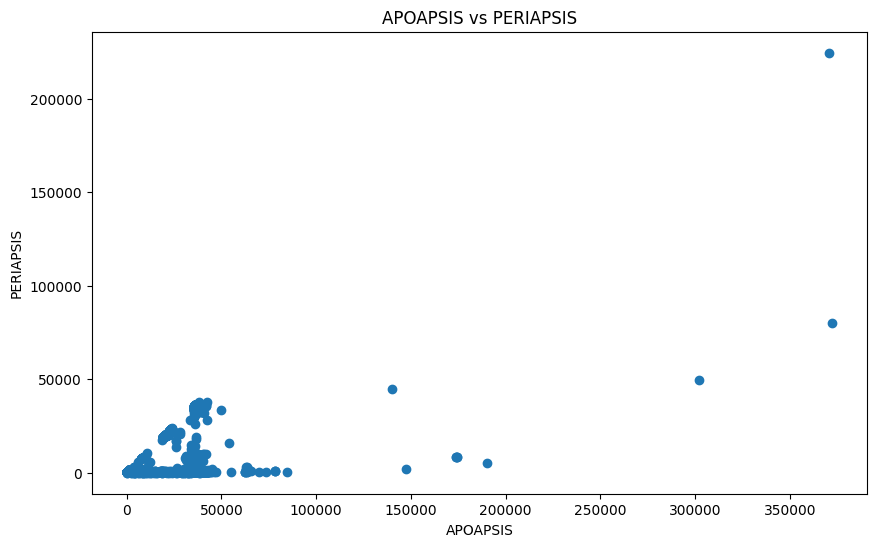

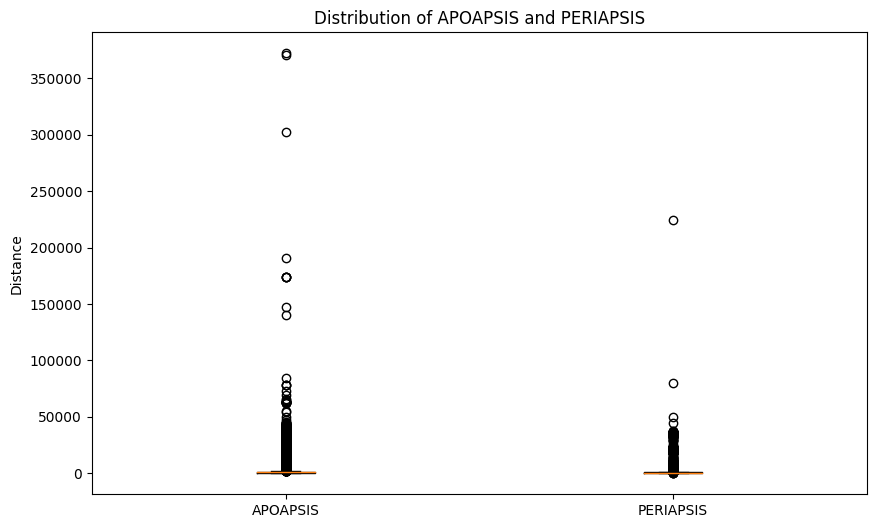

In [37]:
# How do APOAPSIS and PERIAPSIS values differ among the objects?
# What is the relationship between them?
plt.figure(figsize=(10, 6))
plt.scatter(space_df['APOAPSIS'], space_df['PERIAPSIS'])
plt.xlabel('APOAPSIS')
plt.ylabel('PERIAPSIS')
plt.title('APOAPSIS vs PERIAPSIS')
plt.show()


plt.figure(figsize=(10, 6))
plt.boxplot([space_df['APOAPSIS'], space_df['PERIAPSIS']], labels=['APOAPSIS', 'PERIAPSIS'])
plt.ylabel('Distance')
plt.title('Distribution of APOAPSIS and PERIAPSIS')
plt.show()


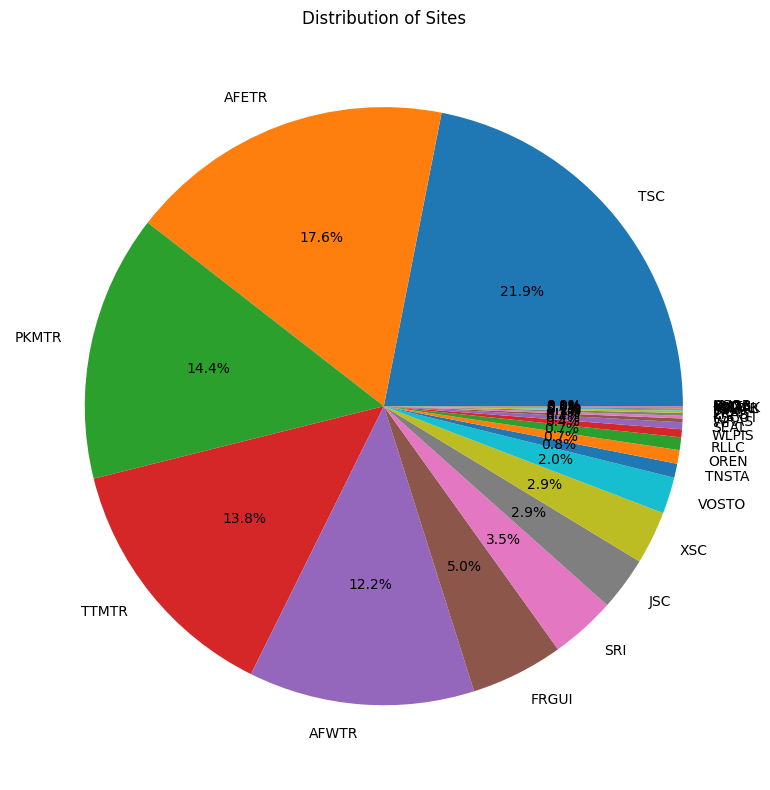

In [38]:
# Count the frequency of each site


# Count the frequency of each site
site_counts = space_df['SITE'].value_counts()

# Plotting the pie chart with adjusted label distance
plt.figure(figsize=(12, 8))
plt.pie(site_counts, labels=site_counts.index, autopct='%1.1f%%', labeldistance=1.1)
plt.title('Distribution of Sites')
plt.tight_layout()
plt.show()


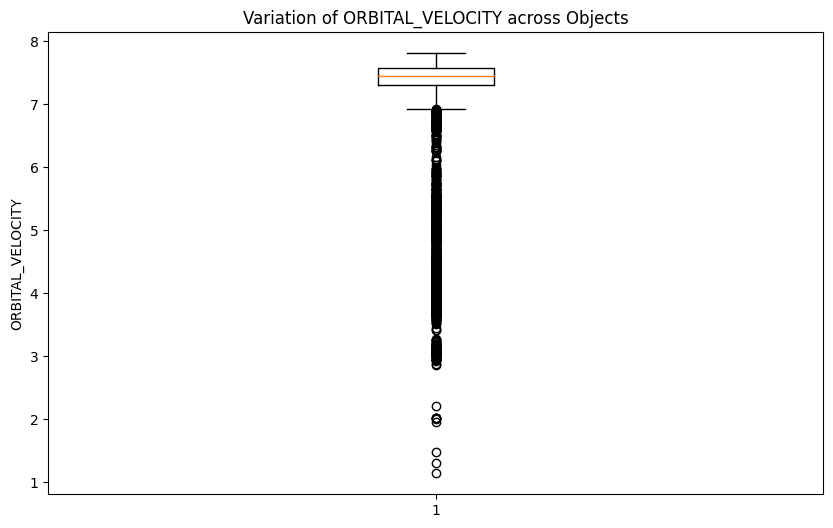

In [39]:
# How does the ORBITAL_VELOCITY vary across the objects?

plt.figure(figsize=(10, 6))
plt.boxplot(space_df['ORBITAL_VELOCITY'])
plt.ylabel('ORBITAL_VELOCITY')
plt.title('Variation of ORBITAL_VELOCITY across Objects')
plt.show()

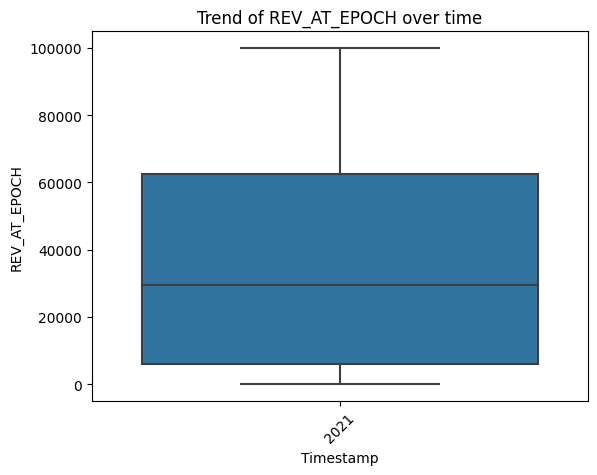

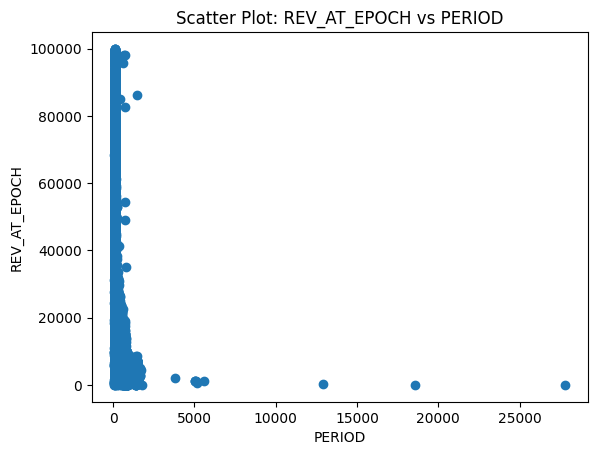

In [40]:
# Plotting the line plot

sns.boxplot(x=space_df['Year'] , y = space_df['REV_AT_EPOCH'])
plt.xlabel('Timestamp')
plt.ylabel('REV_AT_EPOCH')
plt.title('Trend of REV_AT_EPOCH over time')
plt.xticks(rotation=45)
plt.show()


# Plotting the scatter plot
plt.scatter(space_df['PERIOD'], space_df['REV_AT_EPOCH'])
plt.xlabel('PERIOD')
plt.ylabel('REV_AT_EPOCH')
plt.title('Scatter Plot: REV_AT_EPOCH vs PERIOD')
plt.show()

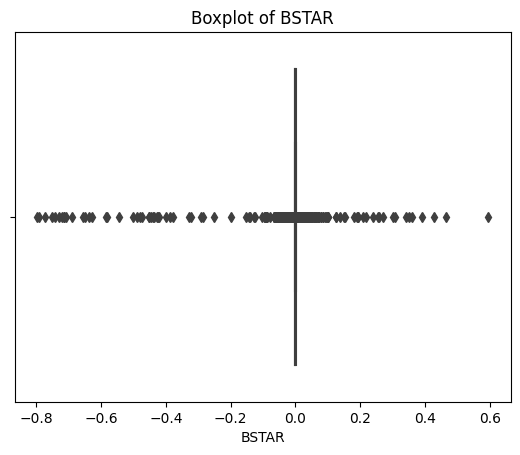

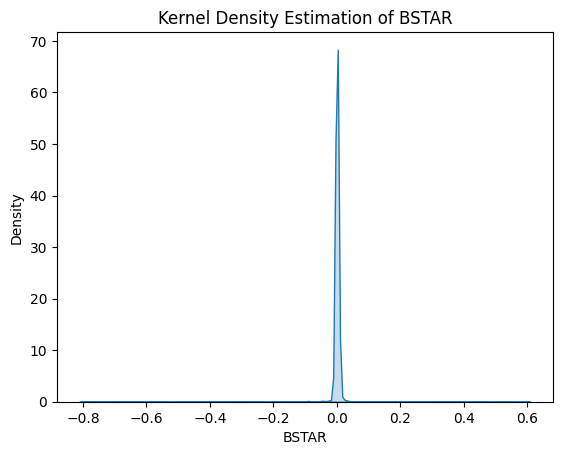

In [41]:
# How does the BSTAR vary overtime?

# Plotting the boxplot
sns.boxplot(x=space_df['BSTAR'])
plt.xlabel('BSTAR')
plt.title('Boxplot of BSTAR')
plt.show()


# Plotting the KDE plot
sns.kdeplot(data=space_df, x='BSTAR', fill=True)
plt.xlabel('BSTAR')
plt.ylabel('Density')
plt.title('Kernel Density Estimation of BSTAR')
plt.show()

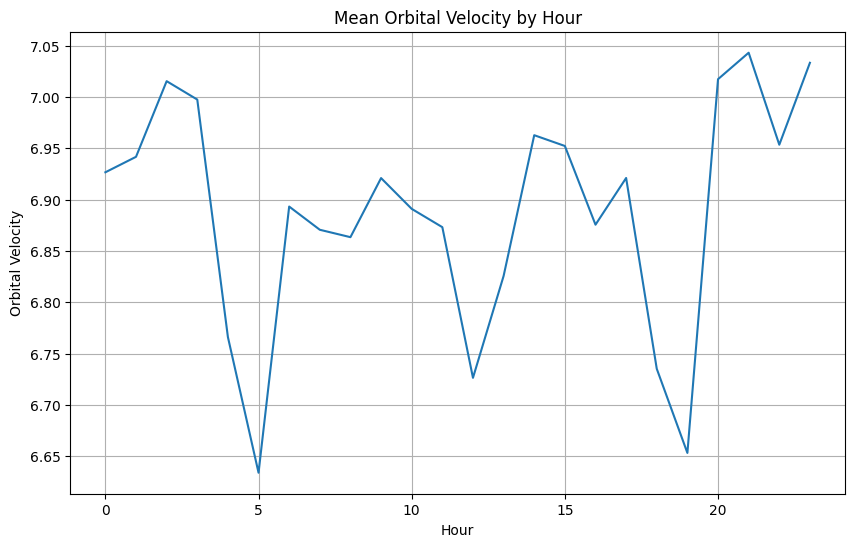

In [42]:
# How does the mean orbital velocity vary for Earth by hour?

# Extract the relevant columns for orbital velocity and hour
data = space_df[['Hour', 'ORBITAL_VELOCITY']]

# Group the data by hour and calculate the mean orbital velocity
mean_orbital_velocity = data.groupby('Hour')['ORBITAL_VELOCITY'].mean()

# Plotting the line plot
plt.figure(figsize=(10, 6))
plt.plot(mean_orbital_velocity.index, mean_orbital_velocity.values)
plt.xlabel('Hour')
plt.ylabel('Orbital Velocity')
plt.title('Mean Orbital Velocity by Hour')
plt.grid(True)
plt.show()

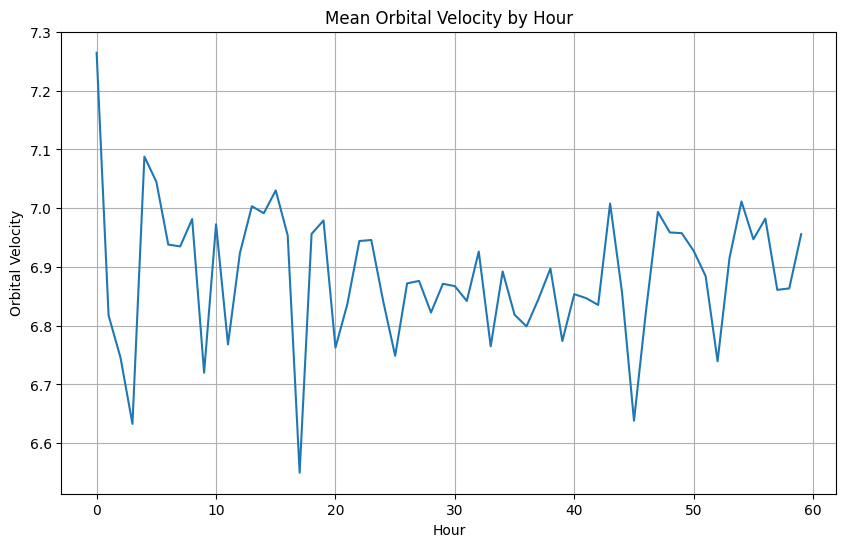

In [43]:
# How does the mean orbital velocity vary for Earth by hour?

# Extract the relevant columns for orbital velocity and hour
data = space_df[['Minute', 'ORBITAL_VELOCITY']]

# Group the data by hour and calculate the mean orbital velocity
mean_orbital_velocity = data.groupby('Minute')['ORBITAL_VELOCITY'].mean()

# Plotting the line plot
plt.figure(figsize=(10, 6))
plt.plot(mean_orbital_velocity.index, mean_orbital_velocity.values)
plt.xlabel('Hour')
plt.ylabel('Orbital Velocity')
plt.title('Mean Orbital Velocity by Hour')
plt.grid(True)
plt.show()

In [45]:
# Save the new dataframe after EDA
# IT requires more preprocessing
space_df.to_csv('spacedebris_clean2.csv',index=False)